# Données et visualisation
## Auteur Linda MARTIN

# Aperçu
Ce notebook effectue une première analyse exploratoire des données (EDA) des jeux de données du défi de prédiction des matières premières de Mitsui & Co. avec python

# Historique des prix
Dans les fichiers train.csv et test.csv contiennent 558 et 559 colonnes. 
Nous avons la date_id qui est l'identifiant temporel. On peut catégoriser les données en 4 catégories LME, JPX,US Stock et Forex.

## Catégorie 1: London Metal Exchange (LME)
Site web: lme.com
Cette catégorie comprend 4 colonnes représentant les cours de clôture de quatre métaux industriels :

    AH (Aluminium)
    CA (Cuivre)
    PB (Plomb)
    ZS (Zinc)

## Catégorie 2: Japan Exchange Group (JPX)
Site web: jpx.co.jp (English, Japanese)
Cette catégorie comprend 40 colonnes couvrant six contrats à terme sur matières premières 
    Gold Mini Futures (Mini contrats à terme sur l’or)
    Gold Rolling Spot Futures (Contrats à terme au comptant glissants sur l’or)
    Gold Standard Futures (Contrats à terme standard sur l’or)
    Platinum Mini Futures (Mini contrats à terme sur le platine)
    Platinum Standard Futures (Contrats à terme standard sur le platine)
    RSS3 Rubber Futures (Contrats à terme RSS3 sur le caoutchouc)

Pour chaque contrat à terme, l’ensemble de données inclut des caractéristiques telles que le cours d’ouverture, le plus haut, le plus bas, le cours de clôture, le volume, le prix de règlement et l’intérêt ouvert.

## Catégorie 3: US Stocks
Site web: nyse.com (NYSE), nasdaq.com (NASDAQ)

Cette catégorie comprend 475 colonnes pour 95 actions et ETF sélectionnés, étroitement liés aux prix des matières premières, par exemple :
    Stock
        PAAS (Pan American Silver Corp. Common Stock)
        NEM (Newmont Corporation)
        GOLD (Barrick Gold Corporation)
        SLB (SLB (Schlumberger Limited))
        ALB (Albemarle Corporation)
    ETF
        GLD (SPDR GOLD TRUST GOLD SHARES NPV)
        IAU (ISHARES GOLD TRUST ISHARES NEW (POST REV SPLIT))
        SLV (ISHARES SILVER TRUST ISHARES)
        URA (GLOBAL X FDS URANIUM ETF USD)
        OIH (VanEck Oil Services ETF)

Pour chaque symbole boursier, l’ensemble de données comprend 5 caractéristiques : cours d’ouverture ajusté, plus haut, plus bas, cours de clôture et volume

## Categorie 4: Change de devises (Forex)
Cette catégorie comprend 38 colonnes représentant les taux de change entre 10 devises majeures :
    CAD (Dollar Canadien)
    CHF (Franc Suisse)
    EUR (Euro)
    GBP (Livre Sterling)
    NZD (Dollar Néo-Zélandais)
    USD (Dollar Américain)
    ZAR (Rand Sud-Africain)
    NOK (Couronne Norvégienne)
    JPY (Yen Japonais)


In [86]:
# Import des bibliothèques nécessaires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import igraph as ig
import random
import matplotlib.colors as mcolors
from scipy.stats import gaussian_kde, norm
from scipy import stats
from IPython import display
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')


In [87]:
# Lecture des fichiers de données de la competition
train =  pd.read_csv('../data/train.csv')
test  =  pd.read_csv('../data/test.csv')
pairs =  pd.read_csv('../data/target_pairs.csv')
labels=  pd.read_csv('../data/train_labels.csv')

Pour mieux comprendre la structure des données, nous allons structurer les noms de colonnes dans un tableau de données. Ce tableau `train_info` contiendra la catégorie, le symbole et le type de chaque colonne.

In [88]:
train_names = train.columns
# Fonction pour nettoyer et split les noms
def clean_and_split(name):
    name = name.replace("open_interest", "open interest")
    name = name.replace("settlement_price", "settlement price")
    name = name.replace("US_Stock", "US Stock")
    name = name.replace("adj_", "adjusted ")
    name = name.replace("-", "_")
    return name.split("_")

# Création du DataFrame d'infos
train_info = pd.DataFrame(
    {
    'Column': train_names,
    'Split': [clean_and_split(name) for name in train_names]
})

train_info['Category'] = train_info['Split'].apply(lambda x: x[0])
train_info['Ticker'] = train_info['Split'].apply(
    lambda x: "_".join(x[1:-1]) if len(x) > 2 else x[-1] if len(x) == 2 else ""
)
train_info['Type'] = train_info['Split'].apply(lambda x: x[-1])

# Nettoyage final
train_info['Ticker'] = train_info.apply(
    lambda row: row['Type'] if row['Ticker'] == "" else row['Ticker'], axis=1
)
train_info['Column_Id'] = train_info.index + 1

# Sélection des colonnes finales
train_info = train_info[['Column_Id', 'Column', 'Category', 'Ticker', 'Type']]

train_info.groupby(['Category'])[["Column_Id", "Ticker"]].count()


,Column_Id,Ticker
Category,,
FX,38,38
JPX,40,40
LME,4,4
US Stock,475,475
date,1,1



# LME: Cours de clôture

Commençons par une analyse exploratoire simple en visualisant les cours de clôture des quatre métaux industriels du LME.


In [89]:
train_info.head()

,Column_Id,Column,Category,Ticker,Type
0,1,date_id,date,id,id
1,2,LME_AH_Close,LME,AH,Close
2,3,LME_CA_Close,LME,CA,Close
3,4,LME_PB_Close,LME,PB,Close
4,5,LME_ZS_Close,LME,ZS,Close


In [90]:
lme_info = train_info[train_info.Category == 'LME']
lme_info


,Column_Id,Column,Category,Ticker,Type
1,2,LME_AH_Close,LME,AH,Close
2,3,LME_CA_Close,LME,CA,Close
3,4,LME_PB_Close,LME,PB,Close
4,5,LME_ZS_Close,LME,ZS,Close


Le graphique révèle que le cuivre (CA) a une échelle de prix significativement différente de celle des trois autres métaux.

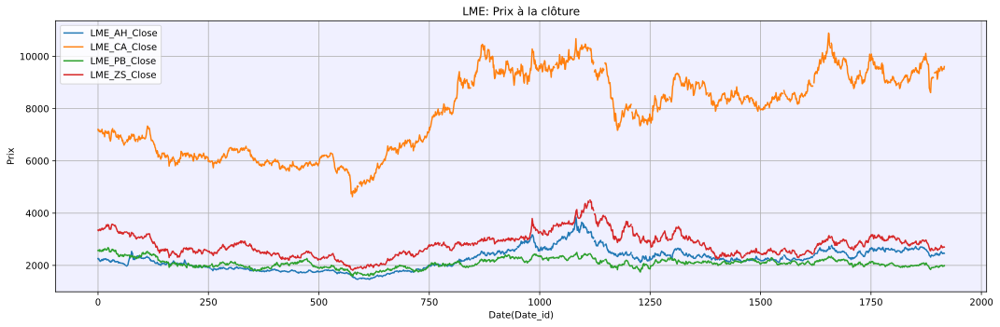

In [91]:
legend = list(train[train_info[train_info.Category == 'LME'].Column].columns.values)

# plot the results
fig,ax = plt.subplots(figsize=(15,5))


ax.plot(train[train_info[train_info.Category == 'LME'].Column])

ax.set_ylabel('Prix')
ax.set_xlabel('Date(Date_id)')
ax.set_title('LME: Prix à la clôture')
ax.set_facecolor('#f0f0ff') 
ax.grid(True)
ax.legend(legend)
plt.tight_layout()
plt.show()


# JPX : Cours de clôture à terme

Nous allons maintenant examiner les cours de clôture des six contrats à terme sur matières premières du JPX. Afin de les comparer sur une échelle similaire, nous utilisons le facettage pour attribuer à chaque contrat à terme son propre panneau.


In [93]:

jpx_info = train_info[(train_info.Category=='JPX') & (train_info.Type=='Close')]
jpx_info


,Column_Id,Column,Category,Ticker,Type
23,24,JPX_Gold_Mini_Futures_Close,JPX,Gold_Mini_Futures,Close
24,25,JPX_Gold_Rolling-Spot_Futures_Close,JPX,Gold_Rolling_Spot_Futures,Close
25,26,JPX_Gold_Standard_Futures_Close,JPX,Gold_Standard_Futures,Close
26,27,JPX_Platinum_Mini_Futures_Close,JPX,Platinum_Mini_Futures,Close
27,28,JPX_Platinum_Standard_Futures_Close,JPX,Platinum_Standard_Futures,Close
28,29,JPX_RSS3_Rubber_Futures_Close,JPX,RSS3_Rubber_Futures,Close


Les graphiques montrent des tendances diverses selon les différents contrats à terme sur matières premières, les contrats sur l'or et le platine présentant des schémas distincts.

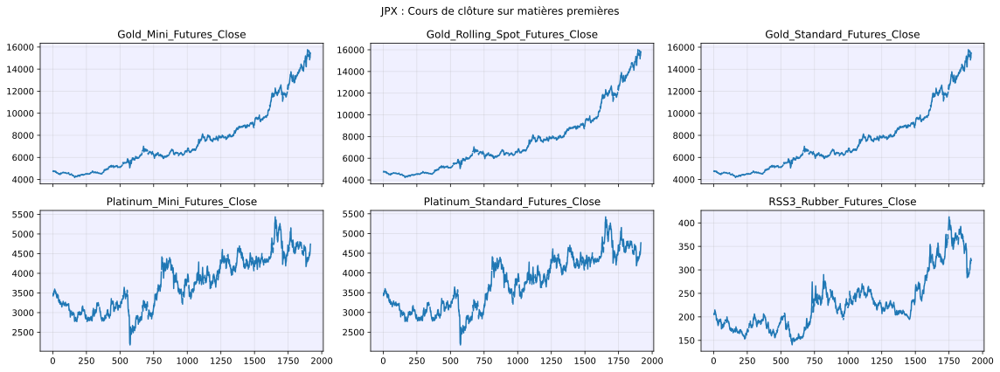

In [94]:
# Sélectionner les colonnes JPX Close et renommer les colonnes
jpx_long = train[jpx_info.Column].rename(columns=lambda x: x.replace("JPX_", "").replace("-","_"), inplace=False)


#  Creer les titres des sous-graphiques
legend = list(jpx_long.columns)

# nombre de ligne de sous-graphiques
l_nb_rows = len(legend) // 3 + (1 if len(legend) % 3 > 0 else 0)
# plot the results
fig, axes = plt.subplots(l_nb_rows, 3, figsize=(16, 6), sharex=True)
axes = axes.flatten()
index = 0
for ax in axes.flat:
    ax.plot(eval("jpx_long.%s" % legend[index]))
    ax.set_title(legend[index])
    ax.set_facecolor('#f0f0ff')
    ax.grid(True, alpha=0.3)
    index +=1

plt.suptitle("JPX : Cours de clôture sur matières premières")
plt.tight_layout()
plt.show()


# US Stock : Prix ​​de clôture ajustés

Examinons maintenant les 95 actions et ETF américains. Nous utiliserons à nouveau le facettage pour observer les séries de prix individuelles.


In [51]:
uss_info = train_info[(train_info.Category=='US Stock') & (train_info.Type=='adjusted close')]
uss_info

,Column_Id,Column,Category,Ticker,Type
330,331,US_Stock_ACWI_adj_close,US Stock,ACWI,adjusted close
331,332,US_Stock_AEM_adj_close,US Stock,AEM,adjusted close
332,333,US_Stock_AG_adj_close,US Stock,AG,adjusted close
333,334,US_Stock_AGG_adj_close,US Stock,AGG,adjusted close
334,335,US_Stock_ALB_adj_close,US Stock,ALB,adjusted close
...,...,...,...,...,...
420,421,US_Stock_X_adj_close,US Stock,X,adjusted close
421,422,US_Stock_XLB_adj_close,US Stock,XLB,adjusted close
422,423,US_Stock_XLE_adj_close,US Stock,XLE,adjusted close
423,424,US_Stock_XOM_adj_close,US Stock,XOM,adjusted close


Remarque : L’axe des ordonnées est limité à une plage de 0 à 150 afin d’améliorer la lisibilité de la plupart des symboles boursiers. Cela peut masquer la totalité des valeurs des symboles les plus chers.

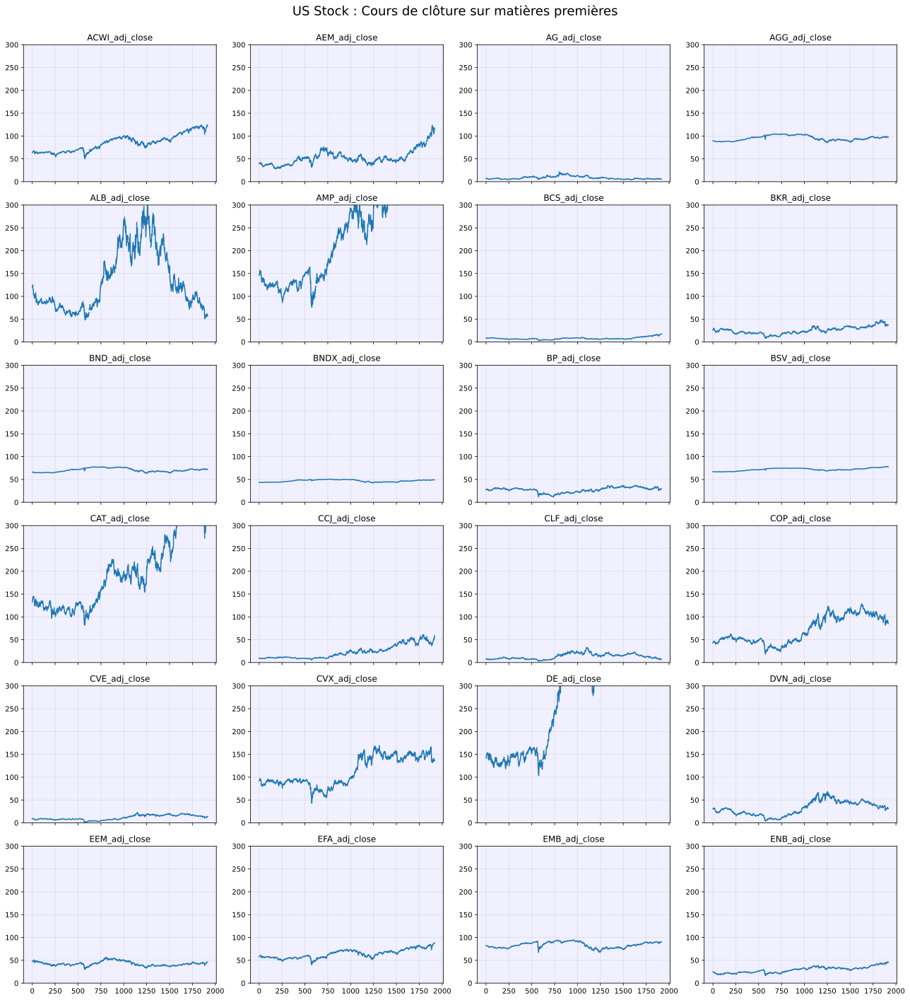

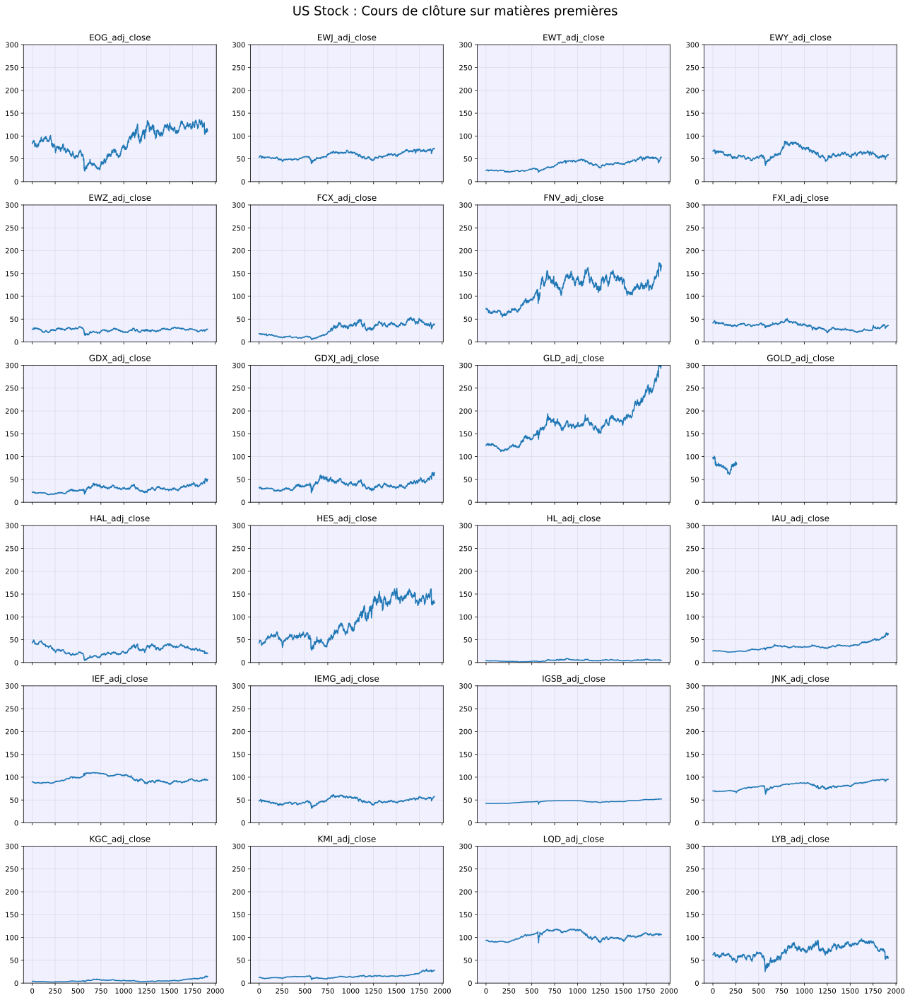

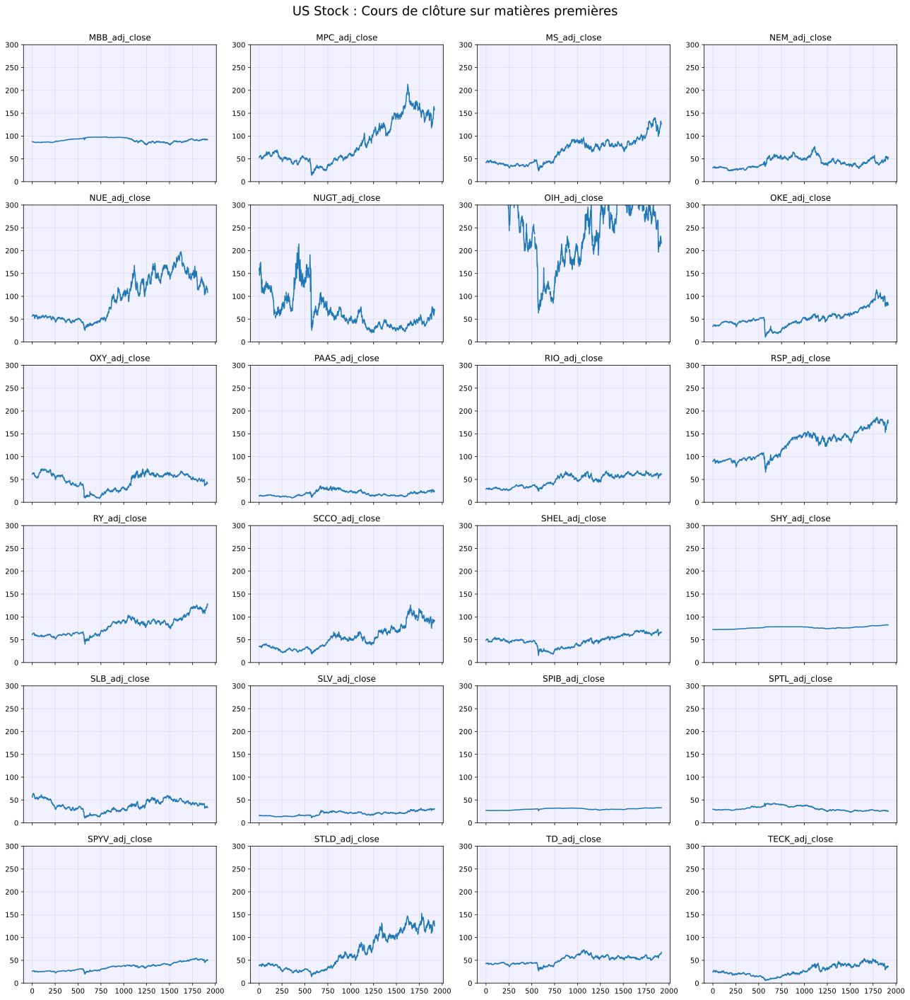

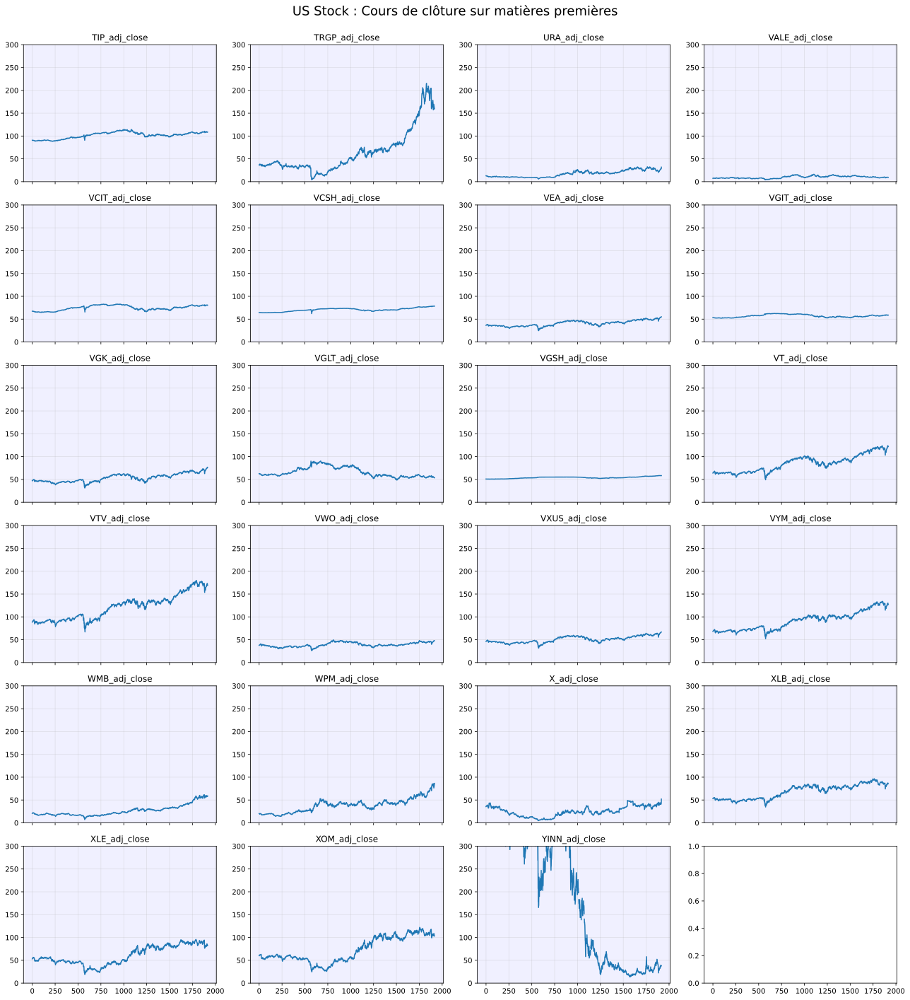

In [98]:
# Sélectionner les colonnes JPX Close et renommer les colonnes
uss_long = train[uss_info.Column].rename(columns=lambda x: x.replace("US_Stock_", "").replace("-","_"), inplace=False)


#  Creer les titres des sous-graphiques
legend = list(uss_long.columns)

# Définir le nombre de graphiques par page
n_cols = 4
n_rows = 6
plots_per_page = n_cols * n_rows
index = 0

for page in range(0, len(legend), plots_per_page):
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(18, 20),
        sharex=True
    )
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        idx = page + i
        if (index >= len(legend)):
            break

        ax.plot(eval("uss_long.%s" % legend[index]))
        ax.set_title(legend[index])
        ax.set_facecolor('#f0f0ff')
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 300)
        index +=1
    plt.suptitle(
    "US Stock : Cours de clôture sur matières premières",
    fontsize=18,
    y=0.98
    )

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


# FOREX : Taux de change des devises étrangères

Enfin, nous analysons la structure des données Forex. Les 38 paires de devises proviennent de 10 devises différentes.


In [99]:
forex_info  = (
    train_info[train_info["Category"] == "FX"]
    .assign(
        Currency_1=lambda df: df["Type"].str.slice(0, 3),
        Currency_2=lambda df: df["Type"].str.slice(3, 6)
    )
    .drop(columns=["Type", "Ticker"])
)

forex_info_jp = forex_info [forex_info["Currency_2"] == "JPY"]
forex_info_jp

,Column_Id,Column,Category,Currency_1,Currency_2
520,521,FX_AUDJPY,FX,AUD,JPY
522,523,FX_CADJPY,FX,CAD,JPY
523,524,FX_CHFJPY,FX,CHF,JPY
526,527,FX_EURJPY,FX,EUR,JPY
529,530,FX_GBPJPY,FX,GBP,JPY
531,532,FX_NZDJPY,FX,NZD,JPY
534,535,FX_USDJPY,FX,USD,JPY
535,536,FX_ZARJPY,FX,ZAR,JPY
556,557,FX_NOKJPY,FX,NOK,JPY


Le graphique ci-dessous illustre les paires de devises incluses dans l'ensemble de données. Par exemple, le yen (JPY) est associé à de nombreuses autres devises, ce qui indique la présence de paires telles que USD/JPY et EUR/JPY.

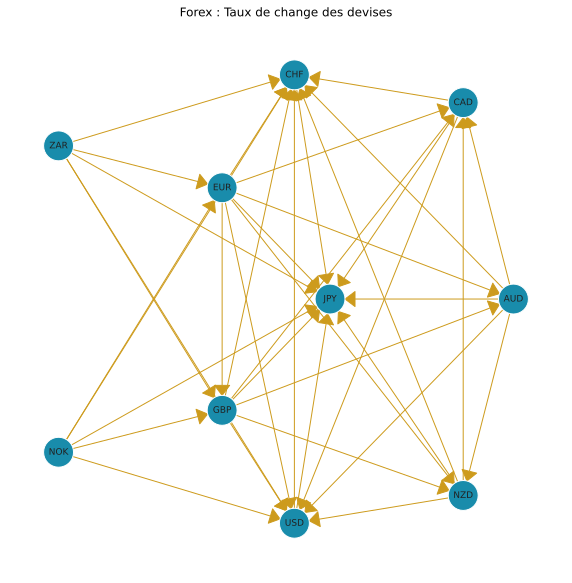

In [100]:
# Reproductibilité
random.seed(42)

# Création du graphe à partir du DataFrame
# forex_info doit contenir les colonnes 'Currency_1' et 'Currency_2'
g = ig.Graph.TupleList(
    forex_info[['Currency_1', 'Currency_2']].itertuples(index=False),
    directed=True
)

# Affichage du graphe avec un style personnalisé
fig, ax = plt.subplots(figsize=(10,10))

# Layout équivalent à layout_nicely
layout = g.layout('kk')

# Style proche de R igraph
visual_style = {
    "vertex_color" : "#198cab",
    "vertex_frame_color" : "white",
    "vertex_size": 30,                   # vertex.size = 30
    "vertex_label": g.vs["name"],
    "vertex_label_size": 9,             # vertex.label.cex ≈ 1.5
    "vertex_label_color": "#202020",
    "edge_color": "goldenrod3",
    "edge_width": 1,
    "edge_lty": 3,
    "layout": layout,
    "arrow_mode":1,  
    "edge_arrow_size":10,                
    "margin":"c(0,0,0.2,0)"   ,                
}

# Plot
ig.plot(g ,target=ax, **visual_style)
# Titre
plt.title("Forex : Taux de change des devises")
plt.show()

Pour conclure notre analyse exploratoire des prix historiques, représentons graphiquement les séries chronologiques de toutes les paires de devises par rapport au yen japonais (JPY).

In [101]:


colors = list(mcolors.XKCD_COLORS.keys())
colors.remove('xkcd:electric lime')
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']



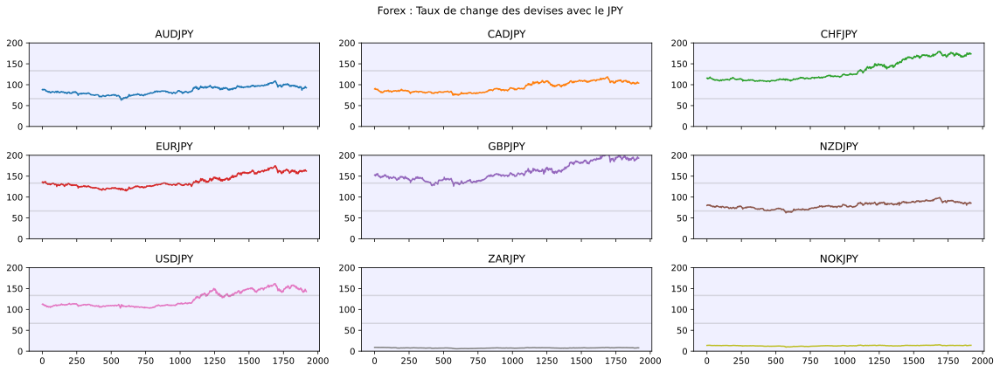

In [102]:
# Sélectionner les colonnes forex du JPX Close et renommer les colonnes

fx_long_jpy = train[forex_info_jp.Column].rename(columns=lambda x: x.replace("FX_", "").replace("-","_"), inplace=False)

#  Creer les titres des sous-graphiques
legend = list(fx_long_jpy.columns)


# nombre de ligne de sous-graphiques
l_nb_rows = len(legend) // 3 + (1 if len(legend) % 3 > 0 else 0)
# plot the results
fig, axes = plt.subplots(l_nb_rows, 3, figsize=(16, 6), sharex=True, tight_layout=True)
axes = axes.flatten()
index = 0
for ax in axes.flat:
    ax.plot(eval("fx_long_jpy.%s" % legend[index]), color=colors[index])
    ax.set_title(legend[index])
    ax.set_ylim(0, 200)
    ax.grid(False)

    ymin, ymax = ax.get_ylim()
    for y in np.linspace(ymin, ymax, 4):
        ax.axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax.set_facecolor('#f0f0ff')
    index +=1
   

plt.suptitle("Forex : Taux de change des devises avec le JPY")
plt.tight_layout()
plt.show()

Les taux de change présentent des niveaux de volatilité et de corrélation variables sur la période observée.

# Logarithmic Returns¶

Le fichier train_labels.csv contient les variables cibles de cette compétition. Il comporte 425 colonnes : une pour date_id et 424 colonnes target_*. La méthode de calcul de chaque cible est expliquée dans la ligne correspondante du fichier target_pairs.csv.

Chaque cible correspond soit au rendement logarithmique d'une variable historique de prix, soit à la différence des rendements logarithmiques de deux variables (un spread ; voir ci-dessous).

Définition du rendement logarithmique

Le rendement logarithmique (ou rendement logarithmique) d'un actif sur k périodes est calculé à partir de son prix à deux instants différents. Soit Pt le prix de clôture à l'instant t et Pt−k le prix k périodes auparavant. Le rendement logarithmique, rt, est défini comme suit 
```math

r_{t} = ln( \frac{P_{t}}{P_{t-k}}) = ln(P_{t}) - ln(P_{t-k})
```

La différence entre les rendements logarithmiques de deux actifs, A et B, est souvent appelée spread. Ce concept est au cœur d'une stratégie connue sous le nom de trading de paires.


```math
Spread_{t} = r^A_t − r^B_t = (ln(P^A_t)−ln(P^A_{t−k}))−(ln(P^B_t)−ln(P^B_{t−k}))

```


Nous définissons d'abord une fonction auxiliaire pour calculer les rendements logarithmiques, puis nous analysons le fichier target_pairs.csv pour comprendre comment chaque cible est construite.

In [103]:
target_definitions = pairs["pair"].str.split(" - ", expand=True)
target_info = pairs.copy()

# Colonnes price_1 et price_2 (équivalent aux colonnes [,1] et [,2])
target_info["price_1"] = target_definitions[0]
target_info["price_2"] = target_definitions[1]

# is.pair = second élément non vide
target_info['is_pair'] = target_info['price_2'].apply(lambda x:x is not None)

# Retirer la colonne "pair"
target_info = target_info.drop(columns=["pair"])


## Rendement logarithmique d'un actif unique

La plupart des objectifs correspondent à des écarts entre deux niveaux de prix. Cependant, quatre objectifs sont basés sur le rendement logarithmique d'un seul actif. Examinons-les en premier.


In [104]:

target_info[~target_info["is_pair"]]


,target,lag,price_1,price_2,is_pair
0,target_0,1,US_Stock_VT_adj_close,None,False
106,target_106,2,US_Stock_VXUS_adj_close,None,False
212,target_212,3,FX_ZARUSD,None,False
318,target_318,4,FX_NOKEUR,None,False


Ces quatre cibles mono-actif sont remarquables. À première vue, le choix de ces actifs spécifiques et des différents décalages (1, 2, 3 et 4) est intrigant et pas immédiatement évident.

Vérification du calcul de la cible (target_0)

Vérifions le calcul de target_0. Nous comparerons les valeurs cibles officielles du fichier train_labels.csv avec notre propre calcul à l'aide de la fonction log_return().


In [59]:
import numpy as np

def log_return(p_data, p_lag=1, p_padding=True):
    data = np.asarray(p_data, dtype=float)
    n=len(p_data)
    logret = np.log(data[p_lag:] / data[:-p_lag])
    if p_padding:
        return np.concatenate([np.full(p_lag, np.nan), logret])
    else:
        return logret

target = pd.DataFrame({
    "date_id": labels["date_id"],
    "target": labels["target_0"],
    "calculated": log_return(train["US_Stock_VT_adj_close"], p_lag=1, p_padding=True)
})

target.head()



,date_id,target,calculated
0,0,0.005948,NaN
1,1,0.005783,0.006785
2,2,0.001048,0.005948
3,3,0.001700,0.005783
4,4,-0.003272,0.001048


Le tableau ci-dessus révèle un détail crucial concernant la définition de la cible. La valeur de `target_0` à `date_id = 0` (soit 0,005948...) ne correspond pas à la valeur calculée à `date_id = 0` (qui est NA). En revanche, elle correspond à la valeur calculée à `date_id = 2`.

Ceci confirme que la cible pour `date_id = t` est le rendement logarithmique calculé de `t + 1` à `t + lag + 1`. Ce rendement peut être obtenu grâce à la fonction `generate_log_returns()`.

La justification de cette cible prospective peut être interprétée comme un scénario de trading hypothétique : à la fin du jour `t`, nous utilisons les informations disponibles jusqu'à ce point pour décider d'une transaction. Nous exécutons ensuite cette transaction au prix de clôture du jour `t + 1`, et la cible représente le rendement logarithmique réalisé de cette position, calculé sur la période de décalage suivante (c'est-à-dire en utilisant le prix à `t + 1 + lag`).

Cette nature prospective est une caractéristique essentielle des jeux de données du concours. Les graphiques suivants montrent que notre série calculée est simplement une version décalée de la série cible officielle.

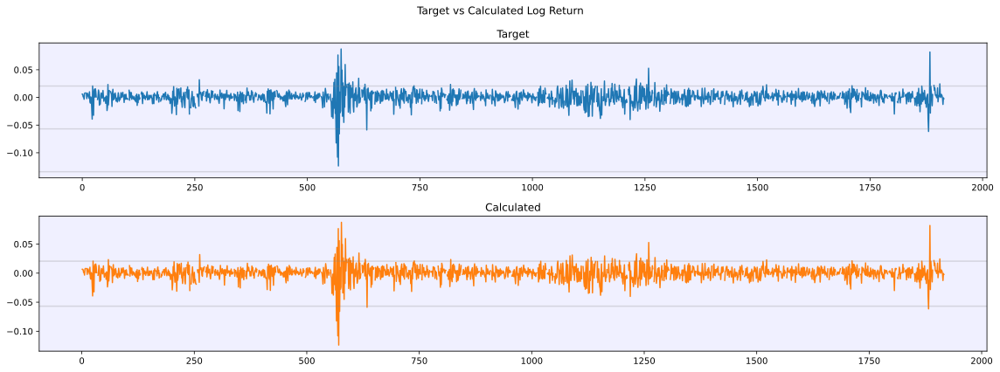

In [105]:
#plot 1: target vs calculated
fig, ax = plt.subplots(2,1,figsize=(16, 6))
ax[0].plot(target["date_id"], target["target"], label="Target", color=colors[0])
ax[1].plot(target["date_id"], target["calculated"], label="Calculated", color=colors[1])
ax[0].set_facecolor('#f0f0ff')
ax[1].set_facecolor('#f0f0ff')
ymin, ymax = ax[1].get_ylim()
for y in np.linspace(ymin, ymax, 4):
    ax[1].axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax[0].axhline(y, color='gray', linestyle='-', alpha=0.25)
ax[0].set_title("Target")
ax[1].set_title("Calculated")

plt.suptitle("Target vs Calculated Log Return")
plt.tight_layout()
plt.show()


Il est bien connu que les rendements logarithmiques financiers ont tendance à présenter des « queues épaisses » par rapport à une distribution normale théorique. Pour vérifier si nos données suivent cette tendance, le graphique suivant compare l'estimation de densité par noyau (EDN) des rendements logarithmiques cibles à une distribution normale de même moyenne et de même écart-type.

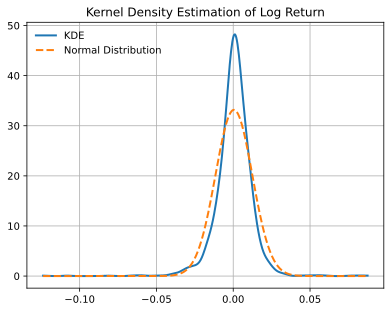

In [106]:
# supprimer les Na de la target 
returns = target.dropna(subset=["target"])["target"]

# Kernel Density Estimation
kde = gaussian_kde(returns)
x = np.linspace(returns.min(), returns.max(), 500)
plt.plot(
    x, kde(x),
    color=colors[0],
    linewidth=2,
    label="KDE"
)

# Normal distribution (mean & sd empiriques)
mu, sigma = returns.mean(), returns.std(ddof=1)

plt.plot(
    x, norm.pdf(x, mu, sigma),
    color=colors[1],
    linestyle="--",
    linewidth=2,
    label="Normal Distribution"
)
plt.grid()
   
# Titres & légende
plt.title("Kernel Density Estimation of Log Return")
plt.legend(loc="upper left", frameon=False)

plt.show()


Le graphique Q-Q (Quantile-Quantile) ci-dessous fournit une preuve supplémentaire de ce comportement « à queue épaisse ».

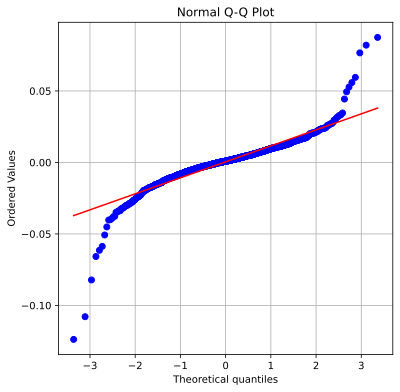

In [107]:
plt.figure(figsize=(6, 6))

# QQ-plot (équivalent qqnorm)
stats.probplot(
    returns,
    dist="norm",
    plot=plt
)

# Titre (R n’en met pas par défaut, optionnel)
plt.title("Normal Q-Q Plot")
plt.grid()
plt.show()



## Vérification du calcul  - target_318

Effectuons la même vérification pour target_318, qui a un décalage de 4.


In [66]:
# traget 318
target_318 = pd.DataFrame({
    "date_id": labels["date_id"],
    "target": labels["target_318"],
    "calculated": log_return(train["FX_NOKEUR"], p_lag=4, p_padding=True)
})

target_318.head(6)

,date_id,target,calculated
0,0,0.006156,NaN
1,1,0.009334,NaN
2,2,0.004108,NaN
3,3,-0.000358,NaN
4,4,0.001180,0.013567
5,5,-0.001062,0.006156


Comme dans l'exemple précédent, les valeurs cibles sont prospectives. La valeur de target_318 à date_id = 0 (0,006156...) correspond à notre valeur calculée à date_id = 5.

Ceci confirme la règle générale : la cible pour date_id = t est le rendement logarithmique calculé à partir des prix à t + 1 et à t + 1 + décalage.

Là encore, le graphique illustre que notre série de rendements logarithmiques calculés correspond parfaitement à la série cible officielle, à un décalage temporel près.



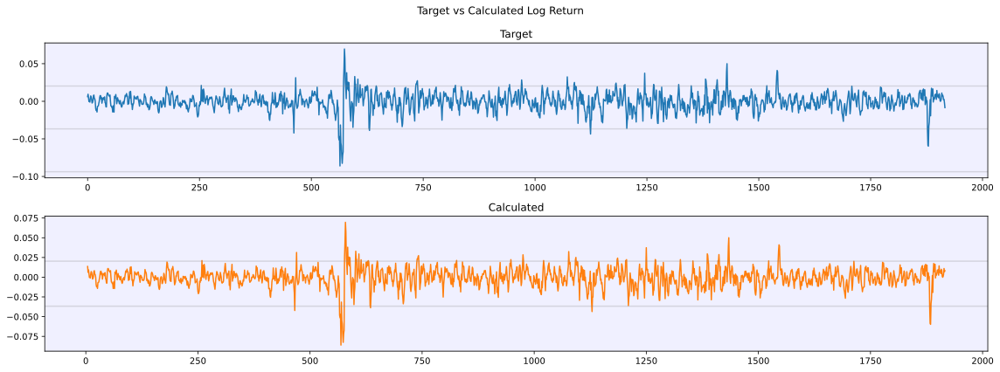

In [108]:
fig, ax = plt.subplots(2,1,figsize=(16, 6))
ax[0].plot(target_318["date_id"], target_318["target"], label="Target", color=colors[0])
ax[1].plot(target_318["date_id"], target_318["calculated"], label="Calculated", color=colors[1])
ax[0].set_facecolor('#f0f0ff')
ax[1].set_facecolor('#f0f0ff')
ymin, ymax = ax[1].get_ylim()
for y in np.linspace(ymin, ymax, 4):
    ax[1].axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax[0].axhline(y, color='gray', linestyle='-', alpha=0.25)
ax[0].set_title("Target")
ax[1].set_title("Calculated")

plt.suptitle("Target vs Calculated Log Return")
plt.tight_layout()
plt.show()

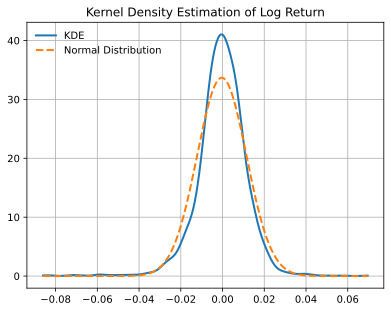

In [69]:
# supprimer les Na de la target 
returns_318=target_318.dropna(subset=["target"])["target"]

# Kernel Density Estimation
kde = gaussian_kde(returns_318)
x = np.linspace(returns_318.min(), returns_318.max(), 500)
plt.plot(
    x, kde(x),
    color=colors[0],
    linewidth=2,
    label="KDE"
)

# Normal distribution (mean & sd empiriques)
mu, sigma = returns_318.mean(), returns_318.std(ddof=1)

plt.plot(
    x, norm.pdf(x, mu, sigma),
    color=colors[1],
    linestyle="--",
    linewidth=2,
    label="Normal Distribution"
)

# Titres & légende
plt.title("Kernel Density Estimation of Log Return")
plt.legend(loc="upper left", frameon=False)
plt.grid()
plt.show()

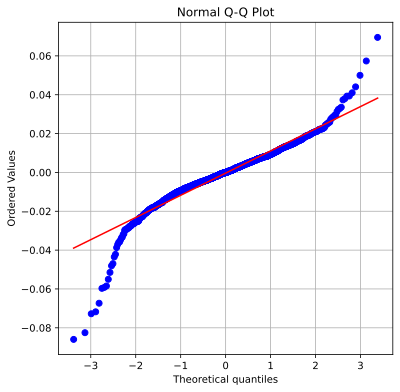

In [70]:
plt.figure(figsize=(6, 6))

# QQ-plot (équivalent qqnorm)
stats.probplot(
    returns_318,
    dist="norm",
    plot=plt
)

# Titre (R n’en met pas par défaut, optionnel)
plt.title("Normal Q-Q Plot")
plt.grid()
plt.show()

## Écart entre deux actifs
La plupart des variables cibles de cette compétition sont des spreads, définis comme la différence entre les rendements logarithmiques de deux actifs différents. Cette approche est essentielle aux stratégies d'arbitrage statistique telles que le trading de paires. Examinons l'une de ces paires pour vérifier son calcul.

In [71]:
target_info[target_info["is_pair"]].head()

,target,lag,price_1,price_2,is_pair
1,target_1,1,LME_PB_Close,US_Stock_VT_adj_close,True
2,target_2,1,LME_CA_Close,LME_ZS_Close,True
3,target_3,1,LME_AH_Close,LME_ZS_Close,True
4,target_4,1,LME_AH_Close,JPX_Gold_Standard_Futures_Close,True
5,target_5,1,LME_ZS_Close,JPX_Platinum_Standard_Futures_Close,True


Comme indiqué dans le tableau ci-dessus, les cibles sont construites à partir d'un ensemble diversifié d'actifs appartenant à différentes catégories (LME, JPX, actions américaines, Forex).

Vérification du calcul de l'écart (cible_2)

À titre d'exemple, nous allons examiner la cible_2, qui correspond à l'écart entre les rendements logarithmiques du cuivre LME (LME_CA_Close) et du zinc LME (LME_ZS_Close). Nous calculerons les rendements logarithmiques individuels de chaque actif, puis leur différence (colonne « Calculé ») et la comparerons à la valeur officielle de la cible_2 dans le fichier train_labels.csv.

In [72]:
target_info.at[3,"price_1"]

'LME_AH_Close'

In [75]:

target_2 = (
    pd.DataFrame({
    "date_id": labels["date_id"],
    "target": labels["target_2"],
    "return_1": log_return(train[target_info.at[3,"price_1"]], p_lag=1),
    "return_2": log_return(train[target_info.at[3,"price_2"]], p_lag=1),
})
.assign(
    calculated=lambda df: df["return_1"] - df["return_2"])
    )


target_2.head()

,date_id,target,return_1,return_2,calculated
0,0,-0.004675,NaN,NaN,NaN
1,1,-0.007052,-0.016250,-0.006591,-0.009659
2,2,-0.008934,0.009826,0.010465,-0.000639
3,3,0.011943,-0.021337,-0.002382,-0.018955
4,4,0.006856,-0.012564,0.009496,-0.022060


Comme pour les objectifs par actif unique, nous constatons que notre série de spreads calculés est une version décalée de la série cible officielle. Ceci confirme que le calcul prospectif s'applique également aux spreads : le spread pour la date_id = t est basé sur les rendements calculés à partir de t + 1.

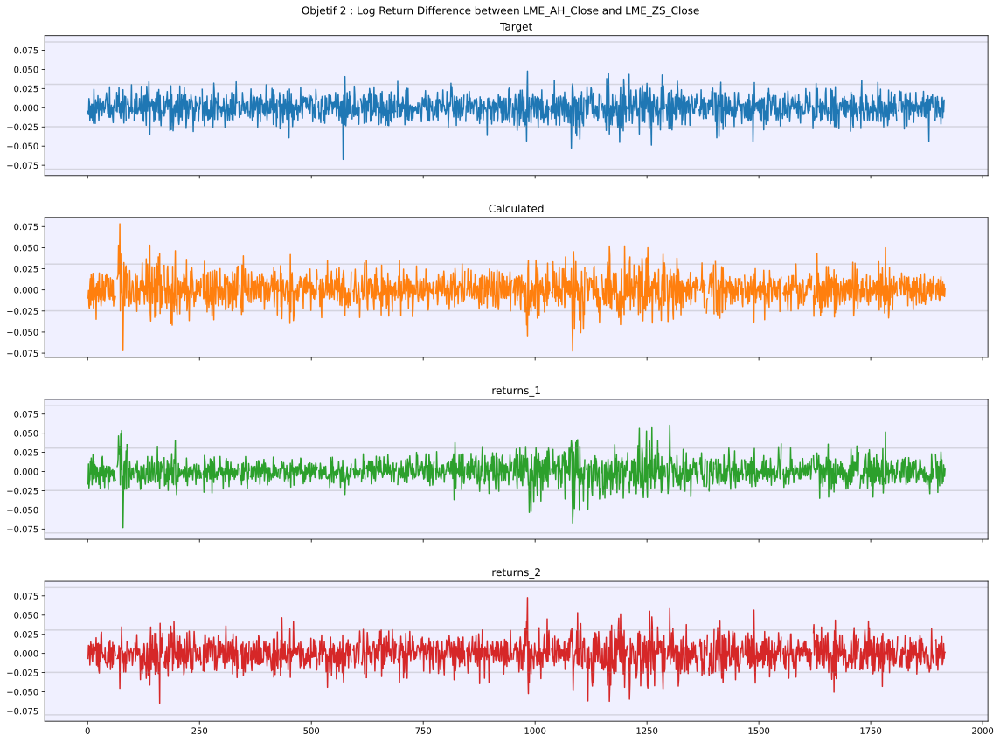

In [77]:
fig, ax = plt.subplots(4,1,figsize=(16, 12), sharex=True)
ax[0].plot(target_2["date_id"], target_2["target"], label="Target", color=colors[0])
ax[1].plot(target_2["date_id"], target_2["calculated"], label="Calculated", color=colors[1])
ax[2].plot(target_2["date_id"], target_2["return_1"], label="returns_1", color=colors[2])
ax[3].plot(target_2["date_id"], target_2["return_2"], label="returns_2", color=colors[3])

ax[0].set_facecolor('#f0f0ff')
ax[1].set_facecolor('#f0f0ff')
ax[2].set_facecolor('#f0f0ff')
ax[3].set_facecolor('#f0f0ff')

ax[0].set_title("Target")
ax[1].set_title("Calculated")
ax[2].set_title("returns_1")
ax[3].set_title("returns_2")

ymin, ymax = ax[1].get_ylim()
for y in np.linspace(ymin, ymax, 4):
    ax[1].axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax[0].axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax[2].axhline(y, color='gray', linestyle='-', alpha=0.25)
    ax[3].axhline(y, color='gray', linestyle='-', alpha=0.25)

plt.suptitle("Objetif 2 : Log Return Difference between %s and %s" % (target_info.at[3,"price_1"], target_info.at[3,"price_2"]))
plt.tight_layout()
fig.subplots_adjust(hspace=0.3, wspace=0.2)
plt.show()

Enfin, créons un nuage de points pour visualiser la relation entre les rendements logarithmiques quotidiens des deux actifs de notre paire (cuivre et zinc). La ligne pointillée représente y = x. Les points proches de cette ligne indiquent les jours où les deux actifs ont affiché des rendements similaires.

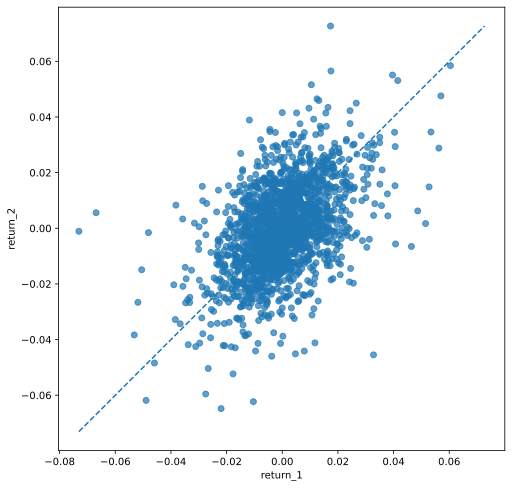

In [78]:
plt.figure(figsize=(8, 8))

# Scatter plot : retunr_2 ~ return_1
plt.scatter(
    target_2["return_1"],
    target_2["return_2"],
    alpha=0.7
)

# Droite y = x (abline(0, 1))
lims = [
    np.nanmin([target_2["return_1"].min(), target_2["return_2"].min()]),
    np.nanmax([target_2["return_1"].max(), target_2["return_2"].max()])
]

plt.plot(
    lims, lims,
    linestyle="--"
)

# Axes & labels
plt.xlabel("return_1")
plt.ylabel("return_2")

plt.axis("equal")
plt.show()

Le nuage de points montre une corrélation positive entre les rendements du cuivre et du zinc, ce qui est attendu pour les métaux industriels.

## Six actifs clés et structure de corrélation

Pour conclure notre analyse exploratoire initiale, visualisons l'ensemble du paysage cible sous forme de graphe de réseau. Dans ce graphe, chaque actif (symbole) est un nœud, et chaque paire cible définie dans target_pairs.csv crée un lien entre deux nœuds. Ceci nous permet de comprendre la structure globale et la connectivité des actifs en concurrence.

Les six actifs suivants semblent plus importants que les autres :

    - Gold_Standard_Futures

    - Platinum_Standard_Futures

    - AH

    - CA

    - PB

    - ZS

In [79]:
temp = (
    target_info
    .assign(
        price_2=lambda df: np.where(
            df["is_pair"] == False,
            df["price_1"],
            df["price_2"]
        )
    )
    .merge(
        train_info[["Ticker", "Column"]]
            .rename(columns={"Ticker": "P1", "Column": "price_1"}),
        on="price_1",
        how="left"
    ).merge(
        train_info[["Ticker", "Column"]]
            .rename(columns={"Ticker": "P2", "Column": "price_2"}),
        on="price_2",
        how="left"
    ))
target_info.head()


,target,lag,price_1,price_2,is_pair
0,target_0,1,US_Stock_VT_adj_close,None,False
1,target_1,1,LME_PB_Close,US_Stock_VT_adj_close,True
2,target_2,1,LME_CA_Close,LME_ZS_Close,True
3,target_3,1,LME_AH_Close,LME_ZS_Close,True
4,target_4,1,LME_AH_Close,JPX_Gold_Standard_Futures_Close,True


In [80]:
temp.head()

,target,lag,price_1,price_2,is_pair,P1,P2
0,target_0,1,US_Stock_VT_adj_close,US_Stock_VT_adj_close,False,VT,VT
1,target_1,1,LME_PB_Close,US_Stock_VT_adj_close,True,PB,VT
2,target_2,1,LME_CA_Close,LME_ZS_Close,True,CA,ZS
3,target_3,1,LME_AH_Close,LME_ZS_Close,True,AH,ZS
4,target_4,1,LME_AH_Close,JPX_Gold_Standard_Futures_Close,True,AH,Gold_Standard_Futures


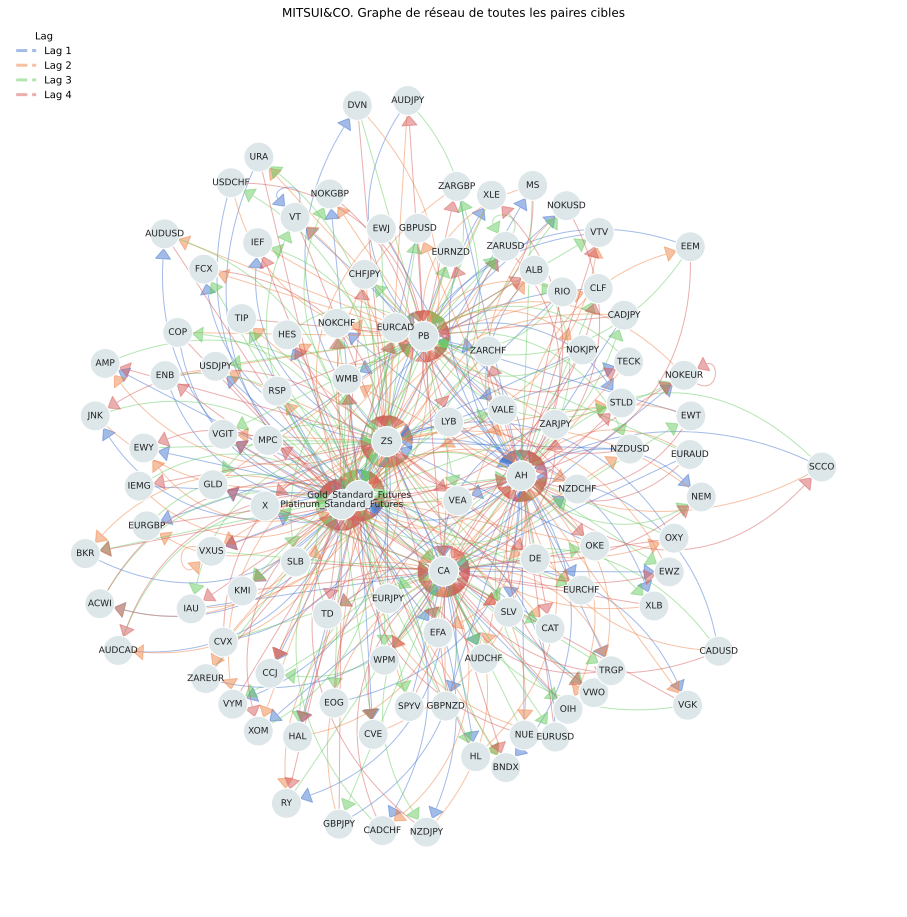

In [81]:
import seaborn as sns
import matplotlib.lines as mlines
# Graphique 
random.seed(42)

# Création du graphe à partir du DataFrame
# forex_info doit contenir les colonnes 'Currency_1' et 'Currency_2'
g = ig.Graph.TupleList(
    temp[['P1', 'P2']].itertuples(index=False),
    directed=True
)
# Palette muted (4 couleurs)
palette = sns.color_palette("muted", 4).as_hex()

# Ajout transparence "80"
palette_alpha = [c + "80" for c in palette]
# Attribution aux arêtes selon temp["lag"]
g.es["color"] = [palette_alpha[i - 1] for i in temp["lag"]]
# Affichage du graphe avec un style personnalisé
fig, ax = plt.subplots(figsize=(16,16))

# Layout équivalent à layout_nicely
layout = g.layout('kk')

# Style proche de R igraph
visual_style = {
    "vertex_color" : "#dde7ea",  
    "vertex_frame_color" : "white",
    "vertex_size": 30,                   # vertex.size = 30
    "vertex_label": g.vs["name"],
    "vertex_label_size": 9,             # vertex.label.cex ≈ 1.5
    "vertex_label_color": "#202020",
    "edge_color": g.es["color"],
    "edge_width": 1,
    "edge_lty": 3,
    "layout": layout,
    "arrow_mode":3,  
    "edge_arrow_size":10,                
    "margin":"c(0,0,0.2,0)"   ,           
}

# Plot
ig.plot(g ,target=ax, **visual_style)
legend_handles = [
    mlines.Line2D(
        [],
        [],
        color=palette_alpha[i],
        linewidth=3,
        linestyle='--',
        label=f"Lag {i+1}"
    )
    for i in range(len(palette_alpha))
]
ax.legend(
    handles=legend_handles,
    loc="upper left",
    frameon=False,
    title="Lag"
)
# Titre
plt.title("MITSUI&CO. Graphe de réseau de toutes les paires cibles")
plt.show()

Comme le montre le tableau ci-dessous, toutes les cibles sont associées à au moins un des six actifs clés « hubs », à l'exception des quatre rendements logarithmiques autoréflexifs.

In [82]:
# filtre sur 
hub_assets = [
    "Gold_Standard_Futures",
    "Platinum_Standard_Futures",
    "AH", "CA", "PB", "ZS"
]

temp_filtered = temp[
    ~temp["P1"].isin(hub_assets) &
    ~temp["P2"].isin(hub_assets)
]

temp_filtered.head()

,target,lag,price_1,price_2,is_pair,P1,P2
0,target_0,1,US_Stock_VT_adj_close,US_Stock_VT_adj_close,False,VT,VT
106,target_106,2,US_Stock_VXUS_adj_close,US_Stock_VXUS_adj_close,False,VXUS,VXUS
212,target_212,3,FX_ZARUSD,FX_ZARUSD,False,ZARUSD,ZARUSD
318,target_318,4,FX_NOKEUR,FX_NOKEUR,False,NOKEUR,NOKEUR


Visualisons la matrice de corrélation pour le groupe de cibles associées à « CA ». Dans le graphique ci-dessous, les 37 premières cibles ont CA comme actif A, tandis que les 33 cibles restantes ont CA comme actif B.

In [83]:
temp_CA1 = temp.loc[temp["P1"] == "CA", "target"]
temp_CA2 = temp.loc[temp["P2"] == "CA", "target"]

temp_CA = pd.concat([temp_CA1, temp_CA2], ignore_index=True)
print(len(temp_CA1), len(temp_CA2))

37 33


In [84]:
# Sélection dynamique des colonnes
labels_CA = labels[temp_CA]

# Matrice de corrélation
cormat_CA = labels_CA.corr(method="pearson")

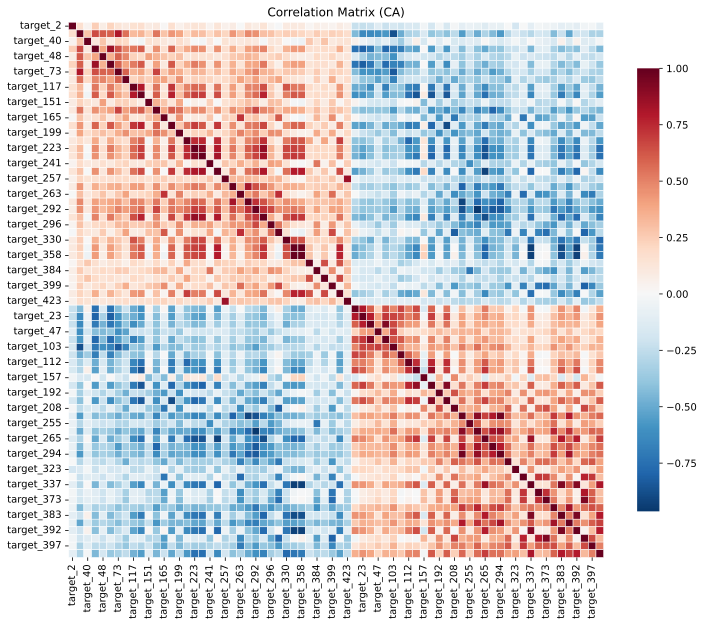

In [85]:
plt.figure(figsize=(12, 10))

sns.heatmap(
    cormat_CA,
    cmap="RdBu_r",          # proche de corrplot(method="color")
    center=0,
    square=True,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"shrink": 0.8}
)

plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title("Correlation Matrix (CA)")
plt.show()